In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pickle
import sys
from pathlib import Path

sys.path.append(str(Path("..", "backend")))
# Ahora sí puedes importar
from models.isolation_model import IsolationForestWithSeverity

# Modelo y Preprocesamiento

En este notebook se probará el método de isolation forest para la deteccion de anomalias en el caso de contugas. Se probaran distintas variables y distintos valores de hiperparametros para determinar el mejor modelo.

El proceso de seleccion es iterativo, por lo que para evitar la calibracion de hiperparametros de modelos no utiles.

El noteboook se estructura de la siguiente manera:

- Preprocesamiento
Seccion donde se complementan las fechas faltantes de los datos, ya que existen "saltos" de intervalos en los datos.

- Declaracion de funciones.
En esta seccion se declaran funciones utiles para el calculo de variables y graficas necesarias para el analisis de los modelos

- Creacion de modelos de Isolation Forest
En esta seccion cabe resaltar que se crea una clase que permite realizar el entrenamiento del modelo y tambien permite calcular el nivel de prioiridad de la anomalia detectada

- Evaluacion de modelos 
En esta seccion se aplicaran diferentes metodos para realizar la evaluacion de cada uno de los modelos propuestos en la seccion anterior

# Preprocesamiento

In [2]:
# Declara directorios útiles para el notebook
PROYECT_DIR = os.path.dirname(os.path.abspath(os.getcwd()))
data_folder = "data"
DATA_FOLDER_DIR = os.path.join(os.path.join(PROYECT_DIR,'backend'),data_folder)
PROCESSED_DATA_FOLDER = os.path.join(DATA_FOLDER_DIR,'processed')
MODEL_FOLDER = os.path.join(os.path.join(PROYECT_DIR,'backend'),"models")

In [3]:
# Lectura de datos
file_name = "datos_unidos.csv"
read_dir = os.path.join(PROCESSED_DATA_FOLDER,file_name)
print(read_dir)
df_total = pd.read_csv(read_dir)
df_total["Fecha"] = pd.to_datetime(df_total["Fecha"])

c:\Users\Paul\Documents\Paul\Cursos\Uniandes\maestria_MIAD\202501\proyecto_final\backend\data\processed\datos_unidos.csv


In [4]:
# Crea el arreglo de fechas
start_date = df_total["Fecha"].min()
end_date = df_total["Fecha"].max()

datetime_list = pd.date_range(start=start_date, end=end_date, freq='h').to_list()
df_datetime_list = pd.DataFrame(datetime_list ,columns=["Fecha"])

In [5]:
# Une informacion de cada cliente con las fechas 
arr_total_fecha = []
for clt in df_total["cliente"].unique():
    fltr = df_total["cliente"] == clt
    df_temp = pd.merge(df_datetime_list,df_total[fltr], on="Fecha", how = "left")
    df_temp["cliente"] = clt
    arr_total_fecha.append(df_temp)

df_total_fecha = pd.concat(arr_total_fecha)

In [6]:
file_name = "datos_unidos_fechas.csv"
write_dir = os.path.join(PROCESSED_DATA_FOLDER,file_name)
df_total_fecha.to_csv(write_dir, index=False)

en la siguiente celda se extrae una muestra de datos (no es escencial para la ejecucion del notebook)

In [7]:
# Extraer una muestra de datos
# file_name = "datos_unidos_fechas.csv"
# write_dir = os.path.join(PROCESSED_DATA_FOLDER,file_name)
# fltr = df_total_fecha["cliente"].isin(["CLIENTE1","CLIENTE5","CLIENTE8"])
# df_total_fecha[fltr].to_csv(write_dir, index=False)

# Funciones

In [8]:
def graficar_anomalias_total_clientes(df_con_anomalias):
    """
        Funcion para graficar los datos normales y anomalos con codigo de colores, segun las 
        clasificaciones existentes en el DataFrame de entrada, para cada uno de los clientes
        rojo -> anomalias nivel alto
        naranja -> anomalias nivel medio
        amarillo -> anomalias nivel bajo
        gris -> valores normales
    """
    
    # Paleta de colores para las anomalías
    palette_iforest = {
        'alta': 'red',
        'media': 'orange',
        'leve': 'yellow'
    }

    # Graficar anomalías por cliente (solo aquellas que Isolation Forest marcó como anómalas)
    for cliente in df_con_anomalias['cliente'].unique():
        df_cli = df_con_anomalias[df_con_anomalias['cliente'] == cliente]

        fig, axes = plt.subplots(3, 1, figsize=(15, 10), sharex=True)
        fig.suptitle(f'Anomalías por Isolation Forest - {cliente}', fontsize=16)

        df_anom = df_cli[(df_cli['anomaly_label'] != 'anomalía')]

        sns.scatterplot(ax=axes[0], data=df_anom, x='Fecha', y='Presion', color='lightgray', s=10, label='normal', alpha=0.5)
        sns.scatterplot(ax=axes[1], data=df_anom, x='Fecha', y='Temperatura', color='lightgray', s=10, label='normal', alpha=0.5)
        sns.scatterplot(ax=axes[2], data=df_anom, x='Fecha', y='Volumen', color='lightgray', s=10, label='normal', alpha=0.5)

        # Solo graficar los puntos marcados como anomalía, categorizados por severidad
        for nivel in ['leve', 'media', 'alta']:
            df_anom = df_cli[
                (df_cli['anomaly_label'] == 'anomalía') &
                (df_cli['nivel_anomalia_iforest'] == nivel)
            ]
            sns.scatterplot(ax=axes[0], data=df_anom, x='Fecha', y='Presion', color=palette_iforest[nivel], s=10, label=nivel, alpha=0.3)
            sns.scatterplot(ax=axes[1], data=df_anom, x='Fecha', y='Temperatura', color=palette_iforest[nivel], s=10, label=nivel, alpha=0.3)
            sns.scatterplot(ax=axes[2], data=df_anom, x='Fecha', y='Volumen', color=palette_iforest[nivel], s=10, label=nivel, alpha=0.3)
       
        axes[0].set_title('Presión [bar]')
        axes[1].set_title('Temperatura [°C]')
        axes[2].set_title('Volumen [m3]')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()

In [9]:
def calcular_moles(df, presion_col='Presion', volumen_col='Volumen', temp_col='Temperatura'):
    """
        Calculo de moles empleando la ecuacion de los gases ideales. Teniendo en cuenta que
        la presion en el parametro de entrada esta en bar, la temperatura en celsius y el
        volumen en m^3

        n = (P * 1e5) * V / (R * (T + 273.15))
        
        con unidades de: 
            P: Presion en pascales
            V: Volumen en m^3
            T: Temperatura en Kelvin
            R: 8.314  # J/(mol·K)

    """
    R = 8.314  # J/(mol·K)
    
    # Asegurarse de que las columnas existan
    if not all(col in df.columns for col in [presion_col, volumen_col, temp_col]):
        raise ValueError("Faltan una o más columnas requeridas en el DataFrame.")
    
    # Aplicar fórmula: n = (P * 1e5) * V / (R * (T + 273.15))
    df['n_moles'] = (df[presion_col] * 1e5 * df[volumen_col]) / (R * (df[temp_col] + 273.15))
    
    return df

# Modelos Isolation Forest

A continuacion se calculan todas las variaciones propuestas del modelo de Isolation Forest para la deteccion de anomalias para el caso de contugas

In [10]:
# Librerias
from sklearn.base import BaseEstimator
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

## Definicion modelo base

Sin importar la variacion aplicada el calculo del modelo sera el mismo, siguiendo los siguientes pasos:

1. Estandarizacion de las variables con StandardScaler
2. Aplicar el modelo de Isolation Forest con los hiperparametros dados de entrada
3. Calculo del nivel de la anomalia a partir del score de salida que entrega el modelo isolation forest
    - Se emplea el quantil 1% sobre el score para indicar las anomalias de nivel alto. Ej si un score esta por encima del 1% es nivel alto
    - Se emplea el quantil 5% el score para indicar las anomalias de nivel medio. Ej si un score esta por encima del 5% pero no supera el 1% sera nivel medio
    - El resto de anomalias que no esten en estas categorias son nivel leve

In [11]:
# Se definen las funciones de la clase IsolationForestWithSeverity
# Definicion de la clase del modelo
# class IsolationForestWithSeverity(BaseEstimator):
#     """
#         Esta clase permite entrenar un isolation forest y calcular un nivel de anomalia
#         que depende de los quantiles del score resultado del entrenamiento en los datos 
#         de entrenamiento
#     """
#     def __init__(self, n_estimators=100, contamination='auto', random_state=42):
#         self.n_estimators = n_estimators
#         self.contamination = contamination
#         self.random_state = random_state
#         self.pipeline = None
#         self.q01 = None
#         self.q05 = None

#     def fit(self, X, y=None):
#         self.pipeline = make_pipeline(
#             StandardScaler(),
#             IsolationForest(
#                 n_estimators=self.n_estimators,
#                 contamination=self.contamination,
#                 random_state=self.random_state
#             )
#         )
#         self.pipeline.fit(X)
#         scores = self.pipeline.named_steps['isolationforest'].decision_function(
#             self.pipeline.named_steps['standardscaler'].transform(X)
#         )
#         self.q01 = np.quantile(scores, 0.01)
#         self.q05 = np.quantile(scores, 0.05)
#         return self

#     def predict(self, X):
#         return self.pipeline.predict(X)

#     def decision_function(self, X):
#         return self.pipeline.decision_function(X)
    
#     def predict_label(self, X):
#         raw_preds = self.predict(X)
#         return np.where(raw_preds == 1, 'normal', 'anomalía')

#     def predict_severity(self, X):
#         scores = self.decision_function(X)
#         labels = self.predict(X)
#         result = pd.DataFrame({
#             'anomaly_score': scores,
#             'anomaly_label': np.where(labels == 1, 'normal', 'anomalía')
#         })
#         result['nivel_anomalia_iforest'] = 'normal'
#         mask_anomaly = result['anomaly_label'] == 'anomalía'
#         result.loc[mask_anomaly, 'nivel_anomalia_iforest'] = result.loc[mask_anomaly, 'anomaly_score'].apply(
#             lambda s: 'alta' if s <= self.q01 else ('media' if s <= self.q05 else 'leve')
#         )
#         return result["nivel_anomalia_iforest"]


# Funcion que crea un modelo IsolationForestWithSeverity para cada cliente de la base.
def create_isolation_forest(df, features, n_estimators=100, contamination='auto', save=False):
    """
        Funcion itera sobre cada cliente de la base entregada como parametro y 
        crea un modelo del tipo IsolationForestWithSeverity para cada uno de ellos

        Adicionalmente la funcion retorna 2 elementos
        - DataFrame: que es el DataFrame de entrada con la adicion de la prediccion,
        el nivel de la anomalia y el score calculado por el modelo.
        - Array: Este elemento contiene cada uno de los modelos creados para cada
        cliente
    """
    isolation_results = []
    isolation_models = []

    # Iterar por cliente
    for cliente in df['cliente'].unique():
        df_cliente = df[df['cliente']==cliente].copy()
        X = df_cliente[features]

        isolation_forest = IsolationForestWithSeverity(n_estimators=n_estimators,
                                                       contamination=contamination,
                                                       random_state=42)
        # Entenar modelo
        isolation_forest.fit(X)
        if save:
            modl_path = os.path.join(MODEL_FOLDER,f'{cliente}_pipeline.pkl')
            with open(modl_path, 'wb') as f:
                pickle.dump(isolation_forest, f)

        X_pred = df_cliente[features].fillna(0)
        df_cliente['anomaly_label'] = isolation_forest.predict_label(X_pred)
        df_cliente['anomaly_score'] = isolation_forest.decision_function(X_pred)
        df_cliente['nivel_anomalia_iforest'] = isolation_forest.predict_severity(X_pred)

        isolation_models.append(isolation_forest)
        isolation_results.append(df_cliente)

    # Concatenamos los resultados
    df_iforest = pd.concat(isolation_results, ignore_index=True)


    return df_iforest, isolation_models


dict_modelos = {}

### Modelo Base

Este modelo base emplea unicamente las variables:
- Presion
- Temperatura
- Volumen

entregadas en el dataset original sin niguna transformacion

In [12]:
features = ['Presion', 'Temperatura', 'Volumen']
df_ifor_base, ifor_models_base = create_isolation_forest(df_total_fecha,features, save=True)

resumen_iforest = df_ifor_base\
    .groupby(['cliente', 'anomaly_label','nivel_anomalia_iforest'])[["Fecha"]].count()

display(resumen_iforest)
# Append a diccionario de resultados
dict_modelos["base"] = (df_ifor_base,
                        ifor_models_base,
                        features)
# graficar_anomalias_total_clientes(df_ifor_base)

Fecha
cliente   anomaly_label nivel_anomalia_iforest       
CLIENTE1  anomalía      alta                      536
                        leve                     7772
                        media                    1740
          normal        normal                  33464
CLIENTE10 anomalía      alta                     2889
...                                               ...
CLIENTE8  normal        normal                  30927
CLIENTE9  anomalía      alta                     1520
                        leve                     3695
                        media                    1740
          normal        normal                  36557

[80 rows x 1 columns]

### Isolation Forest con fillna 0

Para este modelo se aplica un rellenado de los datos faltantes con 0, para evaluar como estara tomando el modelo estos valores. Se emplean las mismas variables del modelo base.

- Presion
- Temperatura
- Volumen

In [19]:
features = ['Presion', 'Temperatura', 'Volumen']
df_ifor_base_fillna, ifor_models_base_fillna = create_isolation_forest(df_total_fecha.fillna(0),features)

resumen_iforest = df_ifor_base_fillna\
    .groupby(['cliente', 'anomaly_label','nivel_anomalia_iforest'])[["Fecha"]].count()

display(resumen_iforest)

# Append a diccionario de resultados
dict_modelos["base_fill"] = (df_ifor_base_fillna,
                             ifor_models_base_fillna,
                             features)
# graficar_anomalias_total_clientes(df_ifor_base_fillna)

Fecha
cliente   anomaly_label nivel_anomalia_iforest       
CLIENTE1  anomalía      alta                      436
                        leve                     6800
                        media                    1740
          normal        normal                  34536
CLIENTE10 anomalía      alta                      436
...                                               ...
CLIENTE8  normal        normal                  36871
CLIENTE9  anomalía      alta                     1084
                        leve                     2775
                        media                    1094
          normal        normal                  38559

[80 rows x 1 columns]

### Isolation Forest con Var temporales

Dado que en el set de datos originales viene la fecha, se extrae informacion adicional de esta, la informacion extraida es la siguiente:

- hora
- dia de la semana (0 = lunes, 6 = domingo)
- mes (0 = enero, 12 = Diciembre)
- dia del mes

Luego de extraidos estos nuevos campos se suman estas variables al modelo base
Es importa resaltar que no se crea relleno de datos faltantes en este modelo

In [20]:
# Funcion para crear las variables temporales
def create_temp_variables(df):
    df['hora'] = df['Fecha'].dt.hour
    df['dia_semana'] = df['Fecha'].dt.dayofweek  # 0 = lunes, 6 = domingo
    df['mes'] = df['Fecha'].dt.month
    df['dia_mes'] = df['Fecha'].dt.day
    return df

df_total_fecha_isloation_temp = create_temp_variables(df_total_fecha.copy())

In [21]:
features = ['Presion', 'Temperatura', 'Volumen','hora','dia_semana','mes','dia_mes']
df_ifor_temp, ifor_models_temp = create_isolation_forest(df_total_fecha_isloation_temp,features)

resumen_iforest = df_ifor_temp\
    .groupby(['cliente', 'anomaly_label','nivel_anomalia_iforest'])[["Fecha"]].count()

display(resumen_iforest)

# Append a diccionario de resultados
dict_modelos["temp"] = (df_ifor_temp,
                             ifor_models_temp,
                             features)
# graficar_anomalias_total_clientes(df_ifor_temp)

Fecha
cliente   anomaly_label nivel_anomalia_iforest       
CLIENTE1  anomalía      alta                      536
                        leve                    17015
                        media                    1740
          normal        normal                  24221
CLIENTE10 anomalía      alta                      805
...                                               ...
CLIENTE8  normal        normal                  19437
CLIENTE9  anomalía      alta                      443
                        leve                     8812
                        media                    2812
          normal        normal                  31445

[80 rows x 1 columns]

### Isolation Forest con Var temporales fillna
Este modelo tiene la misma logica que el anterior, con la adicion de el rellenado de datos faltantes con 0

In [22]:
df_total_fecha_isloation_temp = create_temp_variables(df_total_fecha.copy().fillna(0))

In [23]:
features = ['Presion', 'Temperatura', 'Volumen','hora','dia_semana','mes','dia_mes']
df_ifor_temp_fillna, ifor_models_temp_fillna = create_isolation_forest(df_total_fecha_isloation_temp,features)

resumen_iforest = df_ifor_temp_fillna\
    .groupby(['cliente', 'anomaly_label','nivel_anomalia_iforest'])[["Fecha"]].count()

display(resumen_iforest)

# Append a diccionario de resultados
dict_modelos["temp_fill"] = (df_ifor_temp_fillna,
                             ifor_models_temp_fillna,
                             features)
# graficar_anomalias_total_clientes(df_ifor_temp_fillna)

Fecha
cliente   anomaly_label nivel_anomalia_iforest       
CLIENTE1  anomalía      alta                      436
                        leve                    15458
                        media                    1740
          normal        normal                  25878
CLIENTE10 anomalía      alta                      436
...                                               ...
CLIENTE8  normal        normal                  27859
CLIENTE9  anomalía      alta                      436
                        leve                     4428
                        media                    1740
          normal        normal                  36908

[80 rows x 1 columns]

### Isolation Forest con diferencias 

Para este modelo no se realiza el llenado de datos faltantes, adicionalmente se procede a calcular la diferencia entre el dato presente y su dato anterior.
Cada una de las nuevas variables se bautiza como delta_(variable)

para el modelo se emplean las variables:
- Presion
- Temperatura
- Volumen
- Deltas calculados

In [13]:
def create_diff_variables(df):
    # Step 1: sort by 'cliente' and 'Fecha' globally
    df = df.sort_values(['cliente', 'Fecha'])

    # Step 2: calculate deltas within each group
    df['delta_volumen'] = df.groupby('cliente')['Volumen'].diff()
    df['delta_presion'] = df.groupby('cliente')['Presion'].diff()
    df['delta_temperatura'] = df.groupby('cliente')['Temperatura'].diff()

    return df

df_total_fecha_isloation_temp_diff = create_diff_variables(df_total_fecha)

In [ ]:
features = ['Presion', 'Temperatura', 'Volumen','delta_volumen','delta_presion','delta_temperatura']
df_ifor_diff, ifor_models_diff = create_isolation_forest(df_total_fecha_isloation_temp_diff,
                                                         features,
                                                         save=True)

resumen_iforest = df_ifor_diff\
    .groupby(['cliente', 'anomaly_label','nivel_anomalia_iforest'])[["Fecha"]].count()

display(resumen_iforest)
dict_modelos["diff"] = (df_ifor_diff,
                             ifor_models_diff,
                             features)
# graficar_anomalias_total_clientes(df_ifor_diff)

Fecha
cliente   anomaly_label nivel_anomalia_iforest       
CLIENTE1  anomalía      alta                      536
                        leve                     2177
                        media                    1740
          normal        normal                  39059
CLIENTE10 anomalía      alta                      436
...                                               ...
CLIENTE8  normal        normal                  35009
CLIENTE9  anomalía      alta                      436
                        leve                     1748
                        media                    1741
          normal        normal                  39587

[80 rows x 1 columns]

### Isolation Forest diferencias y fillna

Para este modelo **se realiza** el llenado de datos faltantes, adicionalmente se procede a calcular la diferencia entre el dato presente y su dato anterior.
Cada una de las nuevas variables se bautiza como delta_(variable)

para el modelo se emplean las variables:
- Presion
- Temperatura
- Volumen
- Deltas calculados

In [26]:
df_total_fecha_isloation_temp_diff = create_diff_variables(df_total_fecha.fillna(0))

In [27]:
features = ['Presion', 'Temperatura', 'Volumen','delta_volumen','delta_presion','delta_temperatura']
df_ifor_diff_fillna, ifor_models_diff_fillna = create_isolation_forest(df_total_fecha_isloation_temp_diff,features)

resumen_iforest = df_ifor_diff_fillna\
    .groupby(['cliente', 'anomaly_label','nivel_anomalia_iforest'])[["Fecha"]].count()

display(resumen_iforest)
dict_modelos["diff_fill"] = (df_ifor_diff_fillna,
                        ifor_models_diff_fillna,
                        features)
# graficar_anomalias_total_clientes(df_ifor_diff_fillna)

Fecha
cliente   anomaly_label nivel_anomalia_iforest       
CLIENTE1  anomalía      alta                      436
                        leve                      896
                        media                    1740
          normal        normal                  40440
CLIENTE10 anomalía      alta                      437
...                                               ...
CLIENTE8  normal        normal                  39580
CLIENTE9  anomalía      alta                      436
                        leve                     1468
                        media                    1740
          normal        normal                  39868

[76 rows x 1 columns]

### Isolation Forest con Var temporales y diferencias

Para este modelo se combinan los dos sets de variables creados anteriormente, las variables temporales y los deltas. Por lo tanto se emplearan las variables:

- Presion
- Temperatura
- Volumen
- hora
- dia de la semana (0 = lunes, 6 = domingo)
- mes (0 = enero, 12 = Diciembre)
- dia del mes
- Deltas

In [28]:
df_total_fecha_isloation_temp_diff = create_temp_variables(df_total_fecha.copy())
df_total_fecha_isloation_temp_diff = create_diff_variables(df_total_fecha_isloation_temp_diff)

In [29]:
features = ['Presion', 'Temperatura', 'Volumen', 'hora','dia_semana','mes','dia_mes','delta_volumen','delta_presion','delta_temperatura']
df_ifor_temp_diff, ifor_models_temp_diff = create_isolation_forest(df_total_fecha_isloation_temp_diff,features)

resumen_iforest = df_ifor_temp_diff\
    .groupby(['cliente', 'anomaly_label','nivel_anomalia_iforest'])[["Fecha"]].count()

display(resumen_iforest)
dict_modelos["temp_diff"] = (df_ifor_temp_diff,
                            ifor_models_temp_diff,
                            features)
# graficar_anomalias_total_clientes(df_ifor_temp_diff)

Fecha
cliente   anomaly_label nivel_anomalia_iforest       
CLIENTE1  anomalía      alta                      536
                        leve                     6375
                        media                    1740
          normal        normal                  34861
CLIENTE10 anomalía      alta                      439
...                                               ...
CLIENTE8  normal        normal                  30222
CLIENTE9  anomalía      alta                      436
                        leve                     1357
                        media                    2707
          normal        normal                  39012

[80 rows x 1 columns]

### Isolation Forest con Var temporales y diferecia con fillna

Asi mismo como en los modelos anteriores en esta iteracion **si se realiza** el llenado de valores faltantes con 0. Se emplean las mismas variables que en el modelo anterior

In [30]:
df_total_fecha_isloation_temp_diff = create_temp_variables(df_total_fecha.copy().fillna(0))
df_total_fecha_isloation_temp_diff = create_diff_variables(df_total_fecha_isloation_temp_diff)

In [31]:
features = ['Presion', 'Temperatura', 'Volumen', 'hora','dia_semana','mes','dia_mes','delta_volumen','delta_presion','delta_temperatura']
df_ifor_temp_diff_fillna, ifor_models_temp_diff_fillna = create_isolation_forest(df_total_fecha_isloation_temp_diff,features)

resumen_iforest = df_ifor_temp_diff_fillna\
    .groupby(['cliente', 'anomaly_label','nivel_anomalia_iforest'])[["Fecha"]].count()

display(resumen_iforest)
dict_modelos["temp_diff_fill"] = (df_ifor_temp_diff_fillna,
                                ifor_models_temp_diff_fillna,
                                features)
# graficar_anomalias_total_clientes(df_ifor_temp_diff_fillna)

Fecha
cliente   anomaly_label nivel_anomalia_iforest       
CLIENTE1  anomalía      alta                      436
                        leve                     5597
                        media                    1740
          normal        normal                  35739
CLIENTE10 anomalía      alta                      436
...                                               ...
CLIENTE8  normal        normal                  36039
CLIENTE9  anomalía      alta                      436
                        leve                     1608
                        media                    1740
          normal        normal                  39728

[80 rows x 1 columns]

### Con variable de los gases ideales

Para este modelo se aplica la funcion de los gases ideales para calcular una relacion entre las variables de entrada. 

$$
n = \frac{P_{\text{bar}} \cdot 10^5 \cdot V_{\text{m}^3}}{R \cdot (T_{^\circ C} + 273.15)}
$$


posteriormente se emplea esta unica variable para el modelo.
- numero de moles calculado

In [32]:
# Añadir variables temporales al dataset
df_total_fecha_isloation_temp_diff = df_total_fecha#.fillna(0)

df_total_fecha_moles = calcular_moles(df_total_fecha_isloation_temp_diff)

In [33]:
features = ['n_moles']
df_ifor_moles, ifor_models_moles = create_isolation_forest(df_total_fecha_moles,features)

resumen_iforest = df_ifor_moles\
    .groupby(['cliente', 'anomaly_label','nivel_anomalia_iforest'])[["Fecha"]].count()

display(resumen_iforest)
dict_modelos["moles"] = (df_ifor_moles,
                        ifor_models_moles,
                        features)
# graficar_anomalias_total_clientes(df_ifor_moles)

Fecha
cliente   anomaly_label nivel_anomalia_iforest       
CLIENTE1  anomalía      alta                     1108
                        leve                    15021
                        media                    1178
          normal        normal                  26205
CLIENTE10 anomalía      alta                      441
...                                               ...
CLIENTE8  normal        normal                  23345
CLIENTE9  anomalía      alta                      437
                        leve                     2665
                        media                    1747
          normal        normal                  38663

[80 rows x 1 columns]

#### Con variable de los gases ideales y fillna 
Se emplea la misma funcion que en la iteracion anterior pero esta vez se realiza el llenado de valores faltantes con 0.

Luego se realiza el calculo de moles con la funcion de gases ideales

$$
n = \frac{P_{\text{bar}} \cdot 10^5 \cdot V_{\text{m}^3}}{R \cdot (T_{^\circ C} + 273.15)}
$$

finalmente se emplea esta unica variable para el modelo.
- numero de moles calculado

In [34]:
# Añadir variables temporales al dataset
df_total_fecha_isloation_temp_diff = df_total_fecha.fillna(0)

df_total_fecha_moles = calcular_moles(df_total_fecha_isloation_temp_diff)

In [35]:
features = ['n_moles']
df_ifor_moles_fillna, ifor_models_moles_fillna = create_isolation_forest(df_total_fecha_moles,features)

resumen_iforest = df_ifor_moles_fillna\
    .groupby(['cliente', 'anomaly_label','nivel_anomalia_iforest'])[["Fecha"]].count()

display(resumen_iforest)
dict_modelos["moles_fill"] = (df_ifor_moles_fillna,
                            ifor_models_moles_fillna,
                            features)
# graficar_anomalias_total_clientes(df_ifor_moles_fillna)

Fecha
cliente   anomaly_label nivel_anomalia_iforest       
CLIENTE1  anomalía      alta                      437
                        leve                    14885
                        media                    1740
          normal        normal                  26450
CLIENTE10 anomalía      alta                      444
...                                               ...
CLIENTE8  normal        normal                  23357
CLIENTE9  anomalía      alta                      454
                        leve                     2671
                        media                    1724
          normal        normal                  38663

[80 rows x 1 columns]

### Con variables y moles

Para este modelo se emplea el numero de moles calculado, junto con las variables:
- Presion 
- Temperatura
- Volumen

No se realiza llenado de valores faltantes

In [36]:
# Añadir variables temporales al dataset
df_total_fecha_isloation_temp_diff = df_total_fecha.fillna(0)

df_total_fecha_moles = calcular_moles(df_total_fecha_isloation_temp_diff)

In [37]:
features = ['Presion', 'Temperatura', 'Volumen','n_moles']
df_ifor_base_moles, ifor_models_base_moles = create_isolation_forest(df_total_fecha_moles,features)

resumen_iforest = df_ifor_base_moles\
    .groupby(['cliente', 'anomaly_label','nivel_anomalia_iforest'])[["Fecha"]].count()

display(resumen_iforest)
dict_modelos["base_moles"] = (df_ifor_base_moles,
                        ifor_models_base_moles,
                        features)
# graficar_anomalias_total_clientes(df_ifor_base_moles)

Fecha
cliente   anomaly_label nivel_anomalia_iforest       
CLIENTE1  anomalía      alta                      436
                        leve                     7364
                        media                    1740
          normal        normal                  33972
CLIENTE10 anomalía      alta                      436
...                                               ...
CLIENTE8  normal        normal                  33070
CLIENTE9  anomalía      alta                     1512
                        leve                     3361
                        media                     666
          normal        normal                  37973

[78 rows x 1 columns]

# Combinacion de las variables

# Combinacion sin delta moles
Para este modelo se utilizan todas las variables calulcadas anteriomente, adicional a las variables del modelo base. por lo tanto se tendra el siguiente juego de variables.

- Presion
- Temperatura
- Volumen
- hora
- dia de la semana (0 = lunes, 6 = domingo)
- mes (0 = enero, 12 = Diciembre)
- dia del mes
- Deltas (sin moles)
- numero de moles calculado

In [38]:
# Añadir variables temporales al dataset
df_total_fecha_isloation_total = create_temp_variables(df_total_fecha.copy().fillna(0))
df_total_fecha_isloation_total = create_diff_variables(df_total_fecha_isloation_total)
df_total_fecha_isloation_total = calcular_moles(df_total_fecha_isloation_total)

In [39]:
features = ['Presion', 'Temperatura', 'Volumen','hora','dia_semana','mes','dia_mes','delta_volumen','delta_presion','delta_temperatura','n_moles']
df_ifor_total, ifor_models_total = create_isolation_forest(df_total_fecha_isloation_total,features)

resumen_iforest = df_ifor_total\
    .groupby(['cliente', 'anomaly_label','nivel_anomalia_iforest'])[["Fecha"]].count()

display(resumen_iforest)
dict_modelos["total_sin_delta_mol"] = (df_ifor_total,
                        ifor_models_total,
                        features)
# graficar_anomalias_total_clientes(df_ifor_base_moles)

Fecha
cliente   anomaly_label nivel_anomalia_iforest       
CLIENTE1  anomalía      alta                      436
                        leve                     4385
                        media                    1740
          normal        normal                  36951
CLIENTE10 anomalía      alta                      436
...                                               ...
CLIENTE8  normal        normal                  35256
CLIENTE9  anomalía      alta                      436
                        leve                     2075
                        media                    1740
          normal        normal                  39261

[80 rows x 1 columns]

# Combinacion con delta moles
Para este modelo se utilizan todas las variables calulcadas anteriomente, adicional a las variables del modelo base. Tambien se realiza el calculo del delta de la variable moles calculada.

- Presion
- Temperatura
- Volumen
- hora
- dia de la semana (0 = lunes, 6 = domingo)
- mes (0 = enero, 12 = Diciembre)
- dia del mes
- numero de moles calculado
- Deltas (con moles)

In [40]:
def calcular_delta_moles(df):
    df['delta_moles'] = df.groupby('cliente')['n_moles'].diff()
    return df

In [41]:
features = ['Presion', 'Temperatura', 'Volumen','n_moles','delta_volumen','delta_presion','delta_temperatura','delta_moles']
df_total_test = df_total_fecha.copy()

# Step 2: calculate deltas within each group
df_total_test['delta_volumen'] = df_total_test.groupby('cliente')['Volumen'].diff()
df_total_test['delta_presion'] = df_total_test.groupby('cliente')['Presion'].diff()
df_total_test['delta_temperatura'] = df_total_test.groupby('cliente')['Temperatura'].diff()
df_total_test['delta_moles'] = df_total_test.groupby('cliente')['n_moles'].diff()


df_ifor_moles_delta, ifor_models_moles_delta = create_isolation_forest(df_total_test,features, contamination="auto")

resumen_iforest = df_ifor_moles_delta\
    .groupby(['cliente', 'anomaly_label','nivel_anomalia_iforest'])[["Fecha"]].count()

display(resumen_iforest)
dict_modelos["total_con_delta_mol"] = (df_ifor_moles_delta,
                            ifor_models_moles_delta,
                            features)

Fecha
cliente   anomaly_label nivel_anomalia_iforest       
CLIENTE1  anomalía      alta                      536
                        leve                     3152
                        media                    1740
          normal        normal                  38084
CLIENTE10 anomalía      alta                      436
...                                               ...
CLIENTE8  normal        normal                  34318
CLIENTE9  anomalía      alta                      436
                        leve                     1322
                        media                    1741
          normal        normal                  40013

[80 rows x 1 columns]

# Evaluacion de modelos

Una vez calculados todas las variaciones de variables para el modelo se procede a evaluar el comportamiento de cada uno de estos. Como es un modelo no supervisado, se emplearan diferentes criterios para la evaluacion del modelo.

1. Analisis de la cantidad de cada categiria encontrada, (normal, anomalia alta, anomalia media, anomalia leve)
2. Analisis Visual de las distribuciones de los scores calculados de cada modelo.
3. Analisis de Robustez con datos simulados

In [42]:
def calculo_resumen_modelos(dict_modelos):
    # Copy base DataFrame
    resumen_modelos = df_total_fecha.copy().reset_index()

    # Dynamically assign columns
    for name, (df,mdl,ft) in dict_modelos.items():
        resumen_modelos[f"{name}_score"] = df["anomaly_score"]
        resumen_modelos[f"{name}_nivel"] = df["nivel_anomalia_iforest"]

    return resumen_modelos

In [43]:
resumen_modelos = calculo_resumen_modelos(dict_modelos)

## Analisis de cantidad de anomalias detectadas
En esta seccion se muestra la cantidad de anomalias encontradas por cada modelo, se busca evidenciar modelos que esten encontrando muchas o muy pocas anomalias, dependiendo de su comportamiento pueden ser candidatos a ser eliminados

In [44]:
nivel_cols = [x for x in resumen_modelos.columns if 'nivel' in x]
counts = resumen_modelos[nivel_cols].apply(pd.Series.value_counts).T.fillna(0).astype(int)
counts

,alta,leve,media,normal
base_nivel,31015,128614,34799,675826
base_fill_nivel,19771,101224,26091,723168
temp_nivel,22090,296573,43451,508140
temp_fill_nivel,8720,207286,34800,619448
diff_nivel,15863,58254,39939,756198
diff_fill_nivel,16099,26528,27636,799991
temp_diff_nivel,17784,121068,43352,688050
temp_diff_fill_nivel,8720,68111,34800,758623
moles_nivel,16740,199120,34843,619551
moles_fill_nivel,8844,197671,36930,626809


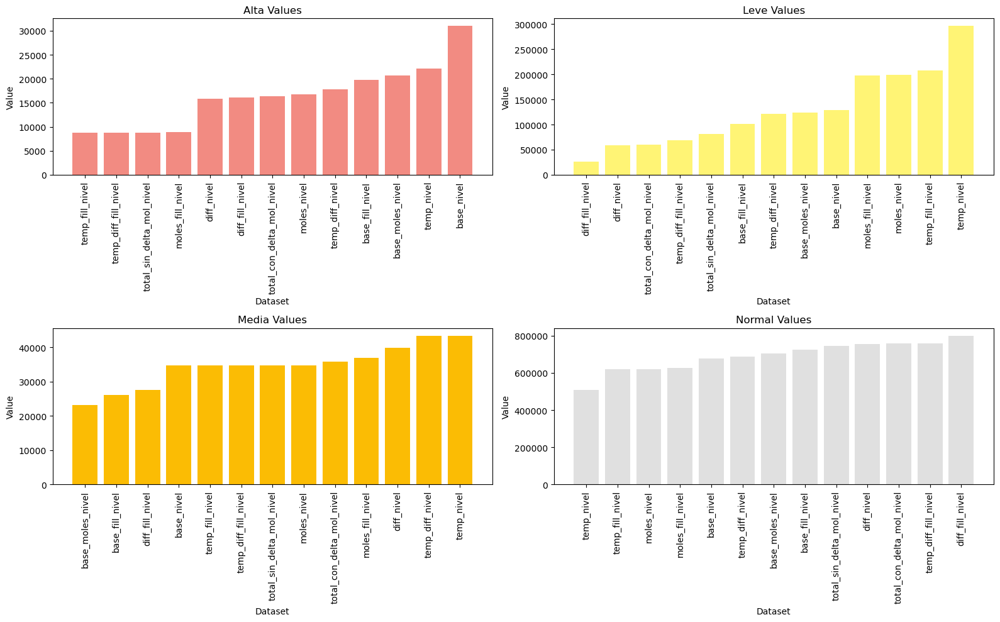

In [45]:
colors = {
    'alta': '#f28b82',    # light red
    'leve': '#fff475',    # light yellow
    'media': '#fbbc04',   # light orange
    'normal': '#e0e0e0'   # light gray
}

# Step 3: Create subplots
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(16, 10))
axs = axs.flatten()

for i, col in enumerate(counts.columns):

    sorted_counts = counts.sort_values(by=col)
    axs[i].bar(sorted_counts.index, sorted_counts[col], color=colors[col])
    
    axs[i].set_title(f'{col.capitalize()} Values')
    axs[i].tick_params(axis='x', rotation=90)
    axs[i].set_ylabel('Value')
    axs[i].set_xlabel('Dataset')

plt.tight_layout()
plt.show()

En estas graficas se hace evidente que el modelo de **diferencias entre variables y llenado de datos faltantes** es el que mas datos normales encuentra. mientras que el modelo **con variables temporales** es el que menos encuentra.

Tambien se evidencia que el modelo **base** es aquel que encuentra mas anomalias graves, mientras que el modelo que usa **variables temporales con llenado de faltantes** es el que menos encuentra.

Estos modelos son evaluados en la siguiente etapa para entender mejor la division de anomalias

## Analisis de la distribucion de Score
En esta seccion se evalua la distribucion del score calculado por cada uno de los modelos entrenados. Para entender las distribuciones se ha de tener en cuenta lo siguiente:

- Para cada modelo un score menor a 0 indica una anomalia.
- Cada cliente de cada modelo tiene un limite distinto para las anomalias medias y altas
- Se prefieren distribuciones bien definidas que logren separar a los clientes, por lo general se deben ver una concentracion alta de clientes a la derecha del 0 (normales) y otra concentracion menor pero evidente a la izquierda del 0 (anomalias)

Para evaluar los modelos se comparan los extremos encontrados con el analisis anterior

In [46]:
def compare_score(modelo_1,modelo_2,resumen_modelos=resumen_modelos):
    clientes = resumen_modelos.cliente.unique()
    score_cols = [x for x in resumen_modelos.columns if 'score' in x]

    n_pairs = len(clientes)
    n_cols = 4  # number of columns in subplot grid
    n_rows = int(np.ceil(n_pairs / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 4 * n_rows))
    axes = axes.flatten()

    for i, clt in enumerate(clientes):
        fltr_clt = resumen_modelos['cliente'] == clt
        clt_score = resumen_modelos[fltr_clt]

        # primera distribucion azul
        sns.kdeplot(clt_score[modelo_1].dropna(), label=modelo_1, fill=True, ax=axes[i])
        q01 = clt_score[modelo_1].quantile(0.01)
        q05 = clt_score[modelo_1].quantile(0.05)
        
        axes[i].axvline(q01, color='blue', linestyle='-', alpha=0.6, label=f"{modelo_1} q01")
        axes[i].axvline(q05, color = 'navy', linestyle='-', alpha=0.6, label=f"{modelo_1} q05")
        
        # segunda distribucion roja
        sns.kdeplot(clt_score[modelo_2].dropna(), label=modelo_2, fill=True, ax=axes[i])
        q01 = clt_score[modelo_2].quantile(0.01)
        q05 = clt_score[modelo_2].quantile(0.05)
        
        axes[i].axvline(q01, color='red', linestyle='-', alpha=0.6, label=f"{modelo_2} q01")
        axes[i].axvline(q05, color = 'darkred', linestyle='-', alpha=0.6, label=f"{modelo_2} q05")

        axes[i].axvline(0, color='black', linestyle='-', alpha=0.6, label=f"0 cut")
        axes[i].set_title(f"Scores: {clt}")  # Title for each subplot

    fig.suptitle(f"Comparación de Distribuciones de Score por Cliente {modelo_1} (azul) vs {modelo_2} (rojo)", fontsize=18, y=1.02)
    plt.tight_layout()
    plt.show()

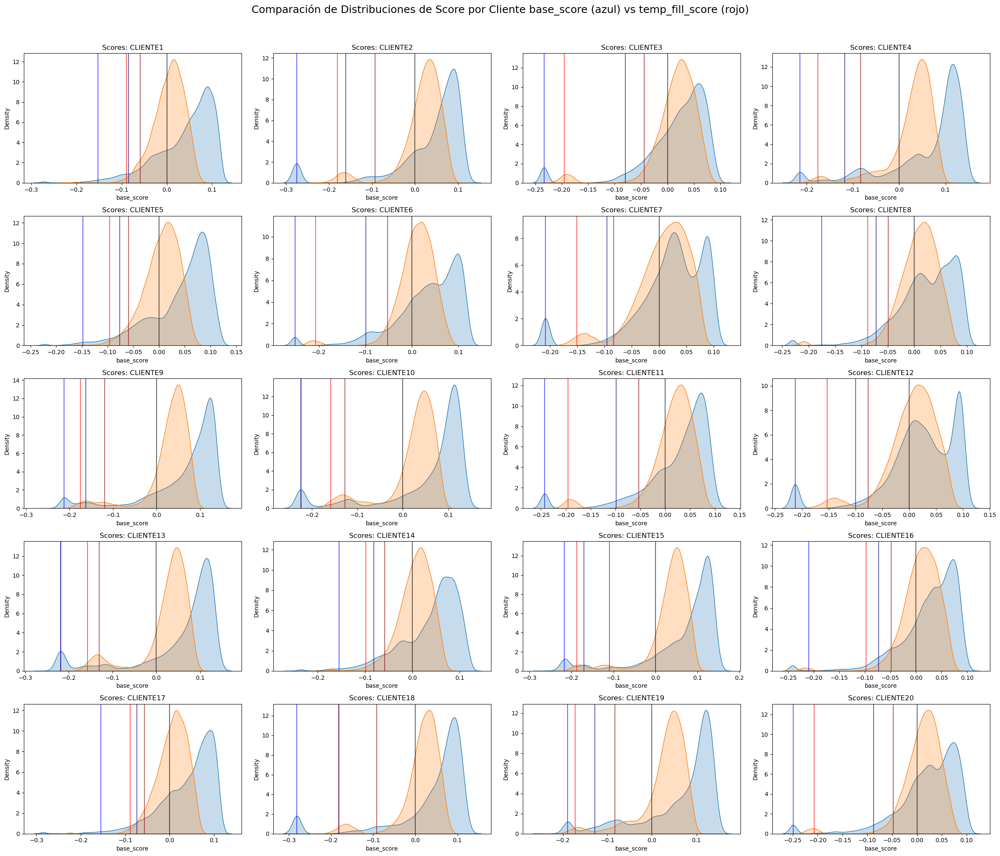

In [47]:
compare_score("base_score","temp_fill_score")

#### Conclusion

En esta grafica se compara el modelo que mas anomalias altas encuentra vs el que menos encuentra, de color azul (el modelo base) y de color rojo (modelo con variables temporales y llenado de faltantes).
En estos se ve que el modelo base en general para todos los clientes cuenta con una distribucion con dos picos uno a la derecha y otro a la izquierda del 0, distanciados el uno del otro. esto implica que el modelo realiza una buena division entre los datos normales y anomalos. A diferencia del segundo modelo cuyo pico de datos normales se encuentra mas cercano al valor limite 0 lo que indica una deficiencia en separar los valores normales de los atipicos.

En conclusion el modelo base es mejor modelo

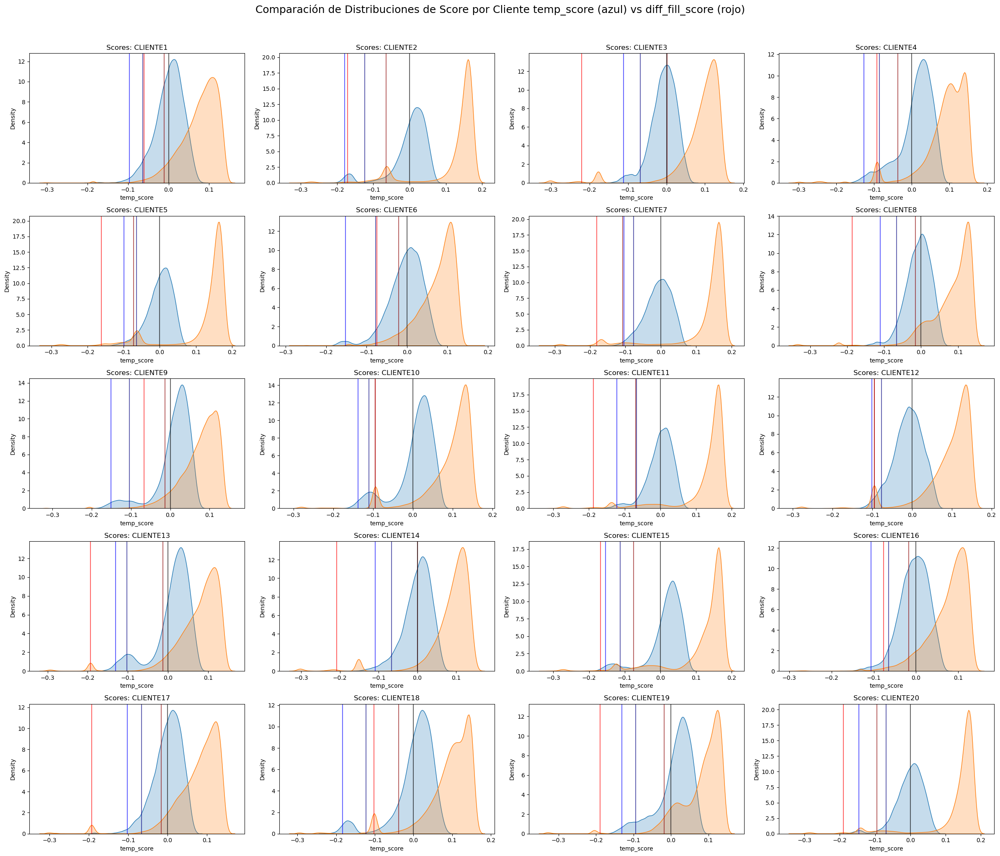

In [48]:
compare_score("temp_score","diff_fill_score")

#### Conclusion

En esta grafica se compara el modelo que mas anomalias encuentra vs el que menos encuentra, de color azul (el con variables temporales) y de color rojo (modelo con deltas y llenado de faltantes).
En estos se ve que el modelo con deltas en general para todos los clientes cuenta con una distribucion que diferencia anomalias de datos normales. Mostrando de manera general un pico a la derecha del 0 (valores normales) y uno o mas picos a la izquierda del 0 (valores anomalos), la presencia de mas de un pico puede indicar una buena propension del modelo a identificar los distintos niveles de gravedad. Por el contrario el segundo modelo posee un pico de datos normales cercano al valor limite 0 lo que indica una deficiencia en separar los valores normales de los atipicos.

En conclusion el modelo con deltas y llenado de faltantes es mejor modelo

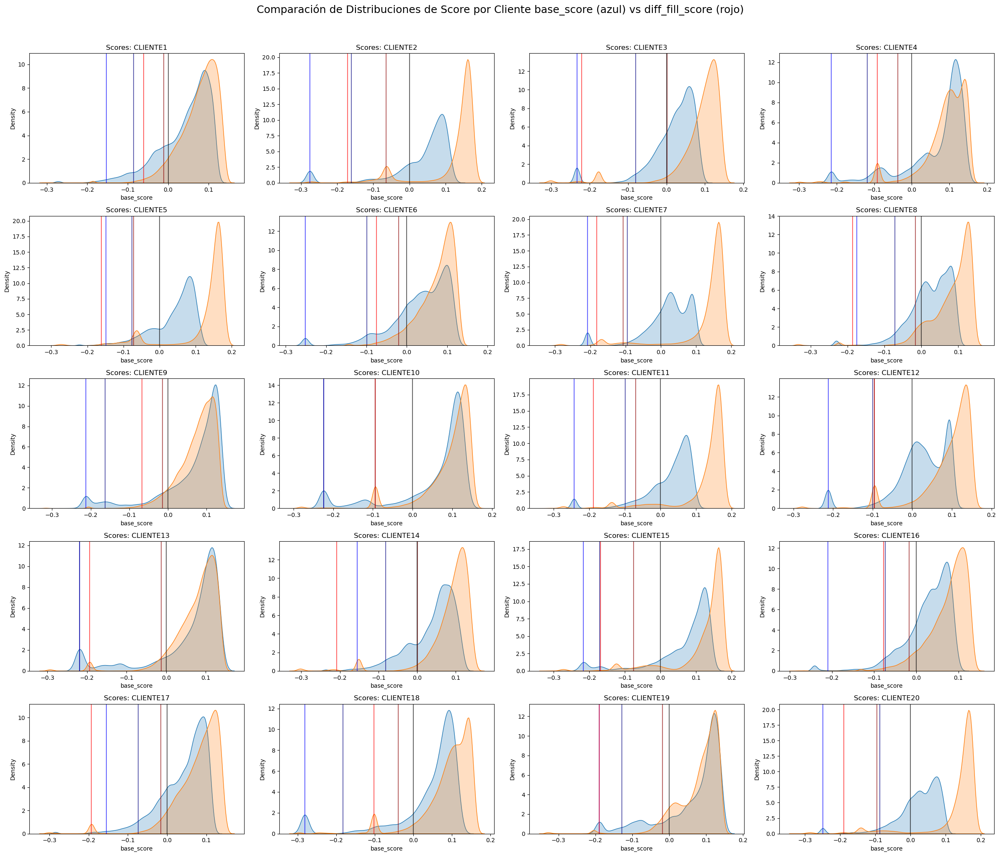

In [49]:
compare_score("base_score","diff_fill_score")

## Simulacion

Para evaluar la robustez del modelo se realizara una simulacion de datos anomalos y normales para la deteccion. Estos datos simulados se construyen con las siguientes consideraciones.

1. Se construyen en el tiempo inmediatamente posterior al ultimo dato suministrado por contugas
2. La proporcion de datos normales y anomalos se construye para mantener un 50 - 50
3. Los datos simulados son aleatorios por en un rango de valores, por lo que no respetan un flujo temporal suave, es decir pueden presentar saltos subitos entre valores consecutivos
4. Los datos simulados se crean para cada una de las variables base (Temperatura, Presion, Volumen)
5. Los datos anomalos se crean por medio de un muestreo aleatorio uniforme (para cada cliente) entre los limites superior e inferior obtenidos al filtrar por un abs(Z-score) >= 3
6. Los datos normales se crean por medio de un muestreo aleatorio uniforme (para cada cliente) entre los limites superior e inferior obtenidos al filtrar por un abs(Z-score) <= 1
7. Las metricas a evaluar son accuracy y f1 score, ya que se determina que para contugas es importante tener un balance entre la precision y recall

In [50]:
def crear_datos_simulacion(df, seed=42):
    np.random.seed(seed)  
    
    arr_data_simulacion = []
    for cliente in df['cliente'].unique():

        # Graficar anomalías por cliente (solo aquellas que Isolation Forest marcó como anómalas)
        fltr = resumen_modelos['cliente'] == cliente
        df_cli = resumen_modelos.loc[fltr,:]

        scaler = StandardScaler()
        # Aplicar escalamiento respetando los NaN
        z_features = ['Presion', 'Temperatura', 'Volumen']
        scaler.fit(df_cli[z_features])
        scaled = scaler.transform(df_cli[z_features].fillna(0))
        df_cli.loc[:,['z_Presion', 'z_Temperatura', 'z_Volumen']] = scaled

        dict_simulacion = {}
        for c in z_features:

            # Selecciona anomalias rango superior
            anom_min = df_cli.loc[df_cli[f"z_{c}"] >= 2,c].min()
            anom_max = df_cli.loc[df_cli[f"z_{c}"] >= 2,c].max()
            if not np.isnan(anom_max) and not np.isnan(anom_min):
                rand_anomalia_1 = np.random.uniform(low=anom_min, high=anom_max, size=50) 
            # Selecciona anomalias rango inferior
            anom_min = df_cli.loc[df_cli[f"z_{c}"] <= -2,c].min()
            anom_max = df_cli.loc[df_cli[f"z_{c}"] <= -2,c].max()
            if not np.isnan(anom_max) and not np.isnan(anom_min):
                rand_anomalia_2 = np.random.uniform(low=anom_min, high=anom_max, size=50) 

            # Selecciona 50 anomalias
            if 'rand_anomalia_1' in locals() and 'rand_anomalia_2' in locals():
                rand_presion_anomalia = np.random.choice(np.concatenate([rand_anomalia_1, rand_anomalia_2])
                                                    ,size=50, replace=False)
            if 'rand_anomalia_1' in locals() and not 'rand_anomalia_2' in locals():
                rand_presion_anomalia = rand_anomalia_1
            if not 'rand_anomalia_1' in locals() and 'rand_anomalia_2' in locals():
                rand_presion_anomalia = rand_anomalia_2

            # Selecciona datos Normales
            norm_max = df_cli.loc[df_cli[f"z_{c}"].abs() <= 1,c].max()
            norm_min = df_cli.loc[df_cli[f"z_{c}"].abs() <= 1,c].min()
            rand_presion_normal = np.random.uniform(low=norm_max, high=norm_min, size=50)

            # Crea array de datos simulados anomalias y normales       
            dict_simulacion[c] = np.concatenate([rand_presion_anomalia, rand_presion_normal])


        df_simulacion = pd.DataFrame(dict_simulacion)

        start_time = df_cli["Fecha"].max() + pd.Timedelta(hours=1)
        timestamps = pd.date_range(start=start_time, periods=100, freq='h')
        df_simulacion.insert(loc=0, column='Fecha', value=timestamps)
        df_simulacion.insert(loc=1, column='cliente', value=cliente)
        df_simulacion["tipo"] = np.concatenate([['anomalia']*50,["normal"]*50])

        arr_data_simulacion.append(df_simulacion)

    df_data_simulacion = pd.concat(arr_data_simulacion, ignore_index=True)
    return df_data_simulacion

In [51]:
df_data_simulacion = crear_datos_simulacion(resumen_modelos)

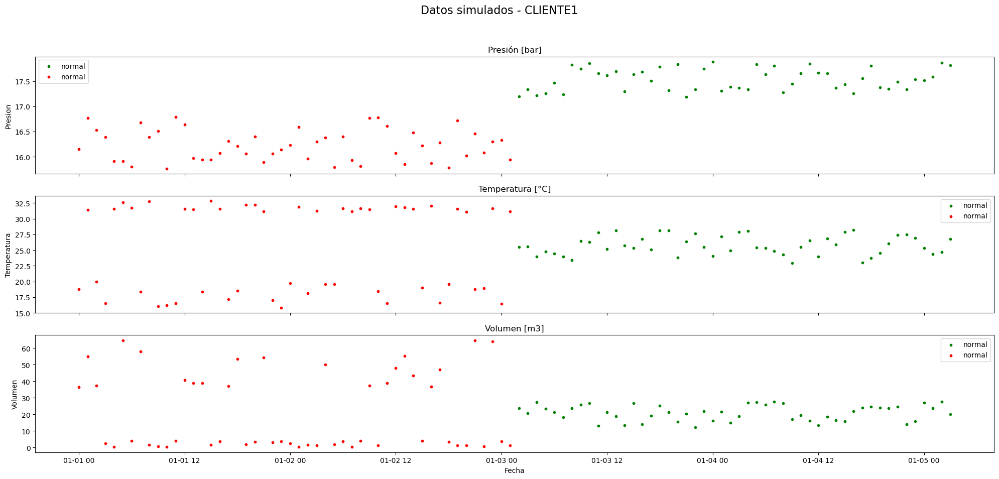

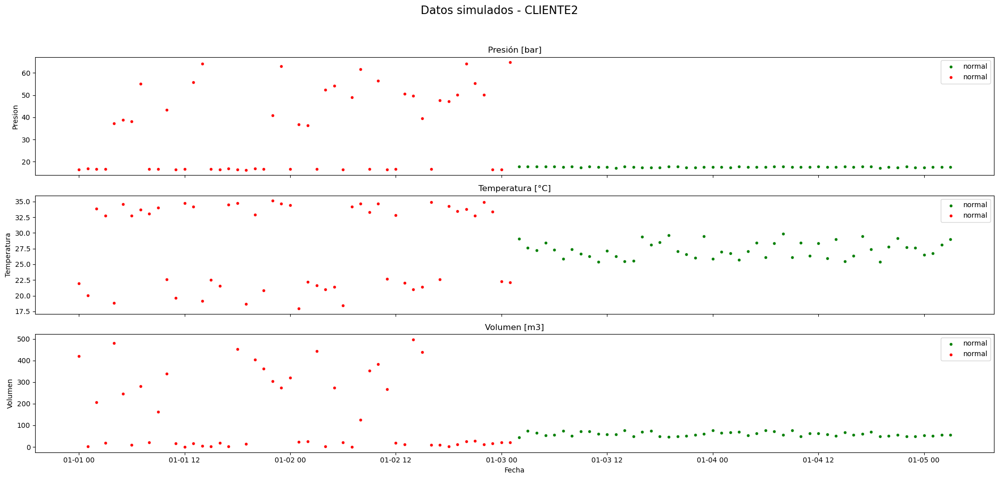

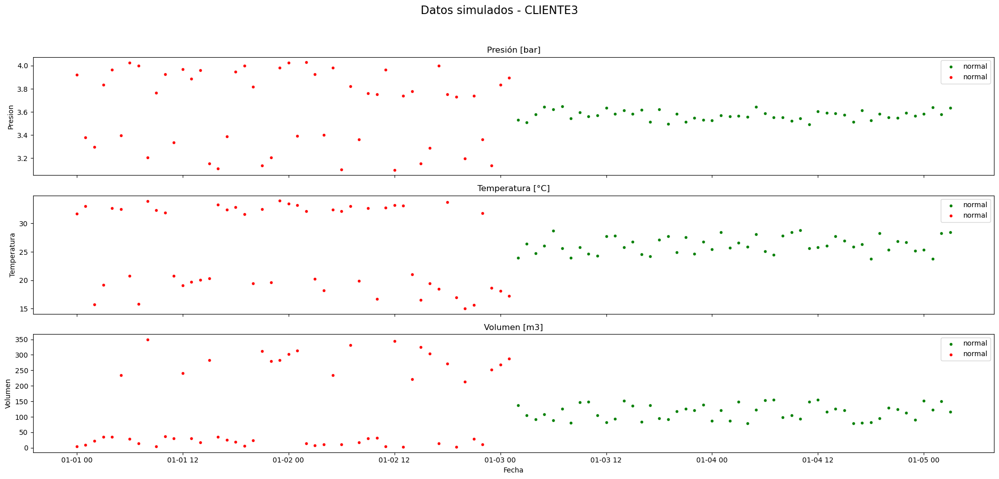

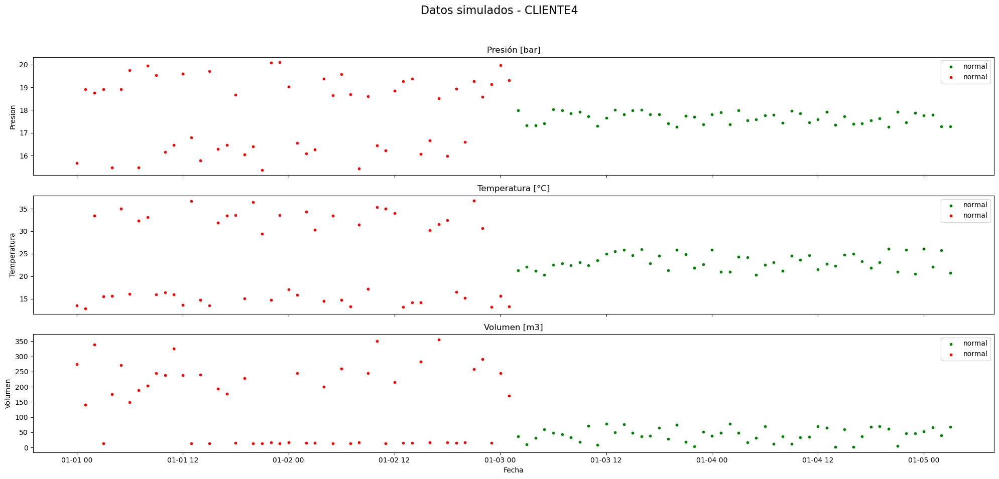

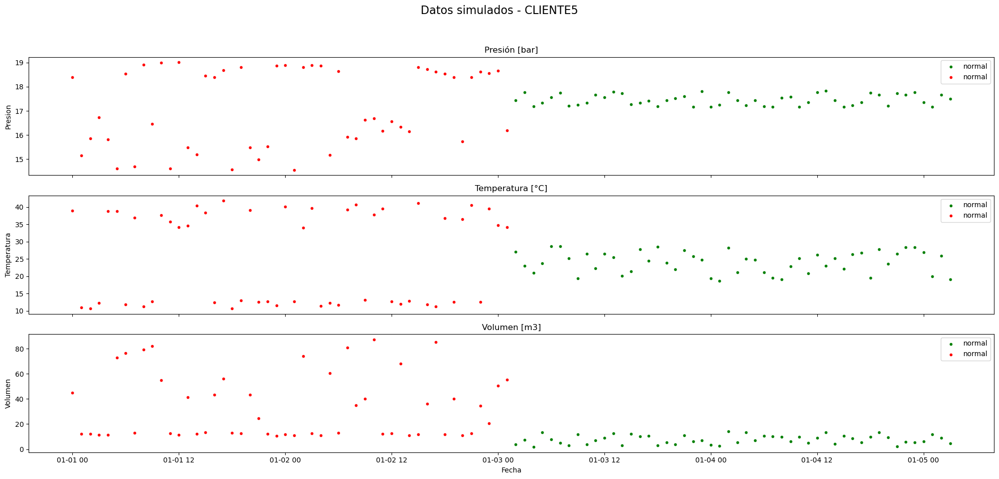

...

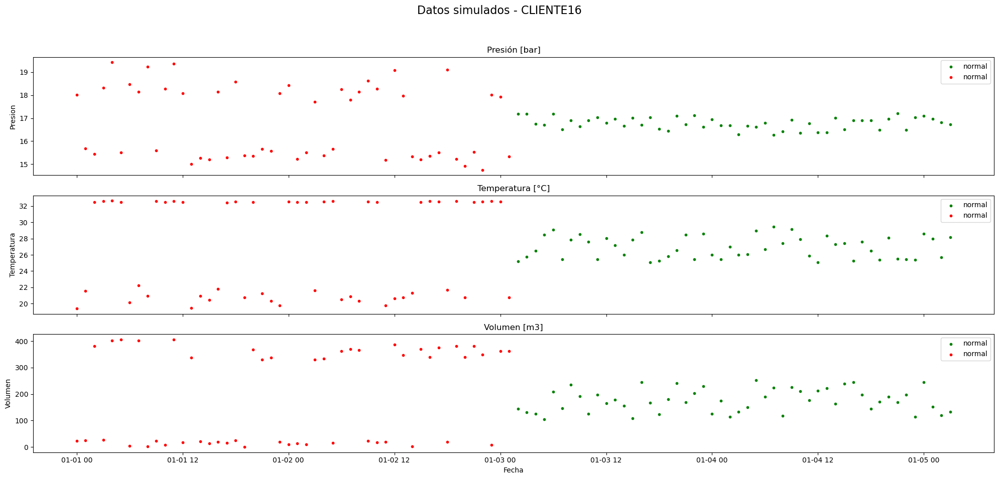

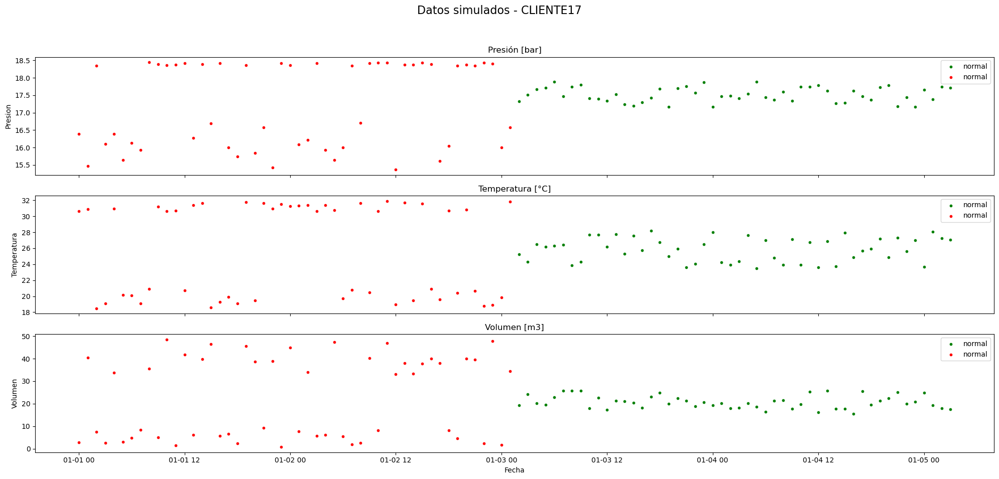

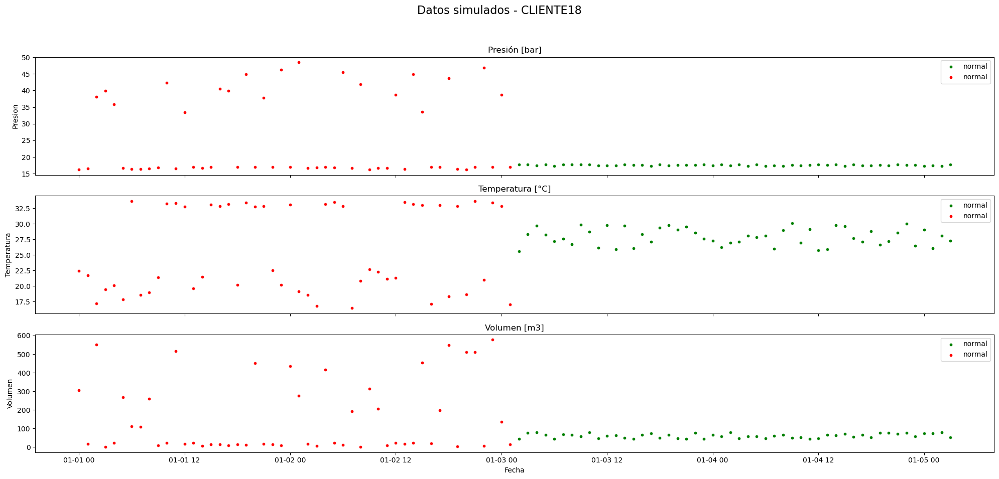

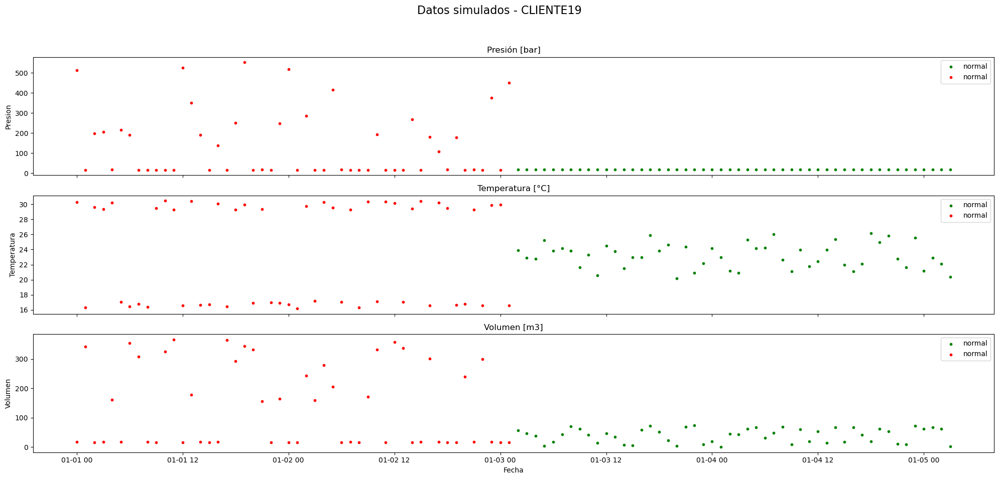

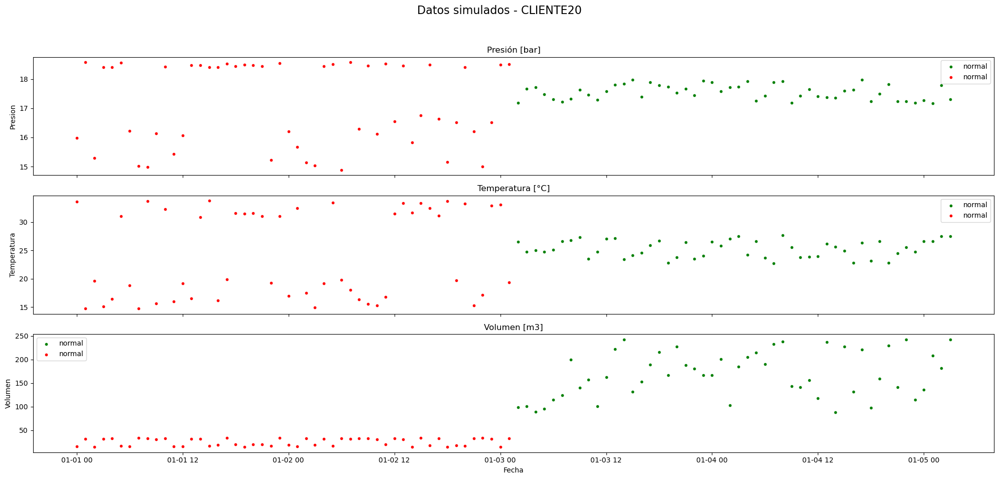

In [52]:
# Grafica de datos simulados

for cliente in df_data_simulacion['cliente'].unique():
    fig, axes = plt.subplots(3, 1, figsize=(20, 10), sharex=True)
    fig.suptitle(f'Datos simulados - {cliente}', fontsize=16)

    fltr_cliente = df_data_simulacion["cliente"] == cliente
    fltr_normal = df_data_simulacion["tipo"] == "normal"
    
    df_anom = df_data_simulacion[fltr_cliente&fltr_normal]

    # Línea base: datos normales
    sns.scatterplot(ax=axes[0], data=df_anom, x='Fecha', y='Presion', color='green', s=20, label='normal' )
    sns.scatterplot(ax=axes[1], data=df_anom, x='Fecha', y='Temperatura', color='green', s=20, label='normal')
    sns.scatterplot(ax=axes[2], data=df_anom, x='Fecha', y='Volumen', color='green', s=20, label='normal')

    # Línea base: datos anomalos
    df_anom = df_data_simulacion[fltr_cliente&~fltr_normal]
    sns.scatterplot(ax=axes[0], data=df_anom, x='Fecha', y='Presion', color='red', s=20, label='normal' )
    sns.scatterplot(ax=axes[1], data=df_anom, x='Fecha', y='Temperatura', color='red', s=20, label='normal')
    sns.scatterplot(ax=axes[2], data=df_anom, x='Fecha', y='Volumen', color='red', s=20, label='normal')

    axes[0].set_title('Presión [bar]')
    axes[1].set_title('Temperatura [°C]')
    axes[2].set_title('Volumen [m3]')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

In [53]:
# Calculo de variables necesarias  para los modelos
df_data_simulacion = create_temp_variables(df_data_simulacion)
df_data_simulacion = create_diff_variables(df_data_simulacion)
df_data_simulacion = calcular_moles(df_data_simulacion)
df_data_simulacion = calcular_delta_moles(df_data_simulacion)

In [54]:
# Prediccion de cada modelo
for key, (df,lst_modelos,features) in dict_modelos.items():
    arr_clts = []
    arr_preds = []
    for i, cliente in enumerate(df_data_simulacion['cliente'].unique()):
        fltr = df_data_simulacion['cliente'] == cliente
        df_cliente = df_data_simulacion.loc[fltr,features]
        preds_sim = lst_modelos[i].predict_severity(df_cliente)
        df_cliente["preds"] = preds_sim
        arr_clts.append(df_cliente)
        arr_preds.append(preds_sim)

    df_preds = pd.concat(arr_preds, ignore_index=True)
    df_preds

    df_data_simulacion[key] = df_preds

In [55]:
from sklearn.metrics import accuracy_score, f1_score

lista_cols = ['tipo']+list(dict_modelos.keys())
df_metrics = df_data_simulacion[lista_cols] == 'normal'
dict_accuracy = {}
dict_f1 = {}
for k in dict_modelos.keys():
    acc = accuracy_score(df_metrics["tipo"],df_metrics[k])
    f1 = f1_score(df_metrics["tipo"],df_metrics[k])
    dict_accuracy[k] = acc
    dict_f1[k] = f1


df_accuracy = pd.DataFrame(index=dict_accuracy.keys(), data=dict_accuracy.values())
df_f1 = pd.DataFrame(index=dict_f1.keys(), data=dict_f1.values())

display(df_accuracy.sort_values(by=0).T)
display(df_f1.sort_values(by=0).T)

,temp,temp_fill,moles,moles_fill,temp_diff,total_con_delta_mol,base_moles,diff,base,base_fill,temp_diff_fill,total_sin_delta_mol,diff_fill
0,0.513,0.5315,0.543,0.545,0.549,0.579,0.611,0.6305,0.631,0.651,0.6615,0.6745,0.7695


,temp,temp_fill,temp_diff,moles,moles_fill,total_con_delta_mol,base_moles,base,diff,base_fill,temp_diff_fill,total_sin_delta_mol,diff_fill
0,0.050682,0.118532,0.178506,0.235786,0.246689,0.28157,0.373591,0.416139,0.417652,0.466361,0.489057,0.518847,0.704676


#### Conclusion 

Para la prueba de robustes se identifica que el mejor modelo es el que tiene **calculo de deltas con llenado de datos faltantes**. Dado que este modelo en el analisis de distribuciones tambien habia obtenido un buen comportamiento. Se decide que a este modelo se le realizará la calibracion de hiperparametros.

## Calibracion de hiperparametros

In [56]:
iter_n_estimators = list(np.arange(100,300,100))
iter_contaminacion = list(np.arange(0.05,0.2, 0.05)) + ["auto"]

combinations = [(n, c) for n in iter_n_estimators for c in iter_contaminacion]

dict_hyper = {}

df_hyper = create_diff_variables(df_total_fecha.fillna(0))

for n_estim, cont in combinations:
    features = ['Presion', 'Temperatura', 'Volumen','delta_volumen','delta_presion','delta_temperatura']
    df_ifor_diff_fillna, ifor_models_diff_fillna = create_isolation_forest(df_hyper,features,
                                                                           n_estimators=n_estim,contamination=cont)

    # resumen_iforest = df_ifor_diff_fillna\
    #     .groupby(['cliente', 'anomaly_label','nivel_anomalia_iforest'])[["Fecha"]].count()

    # display(resumen_iforest)
    
    dict_hyper[f"est_{n_estim}_cont_{cont}"] = (df_ifor_diff_fillna,
                            ifor_models_diff_fillna,
                            features)

In [57]:
df_data_simulacion = crear_datos_simulacion(resumen_modelos)
df_data_simulacion = create_diff_variables(df_data_simulacion)

In [58]:
# Prediccion de cada modelo
for key, (df,lst_modelos,features) in dict_hyper.items():
    arr_clts = []
    arr_preds = []
    for i, cliente in enumerate(df_data_simulacion['cliente'].unique()):
        fltr = df_data_simulacion['cliente'] == cliente
        df_cliente = df_data_simulacion.loc[fltr,features]
        preds_sim = lst_modelos[i].predict_severity(df_cliente)
        df_cliente["preds"] = preds_sim
        arr_clts.append(df_cliente)
        arr_preds.append(preds_sim)

    df_preds = pd.concat(arr_preds, ignore_index=True)
    df_preds

    df_data_simulacion[key] = df_preds

In [59]:
from sklearn.metrics import accuracy_score, f1_score

lista_cols = ['tipo']+list(dict_hyper.keys())
df_metrics = df_data_simulacion[lista_cols] == 'normal'
dict_accuracy = {}
dict_f1 = {}
for k in dict_hyper.keys():
    acc = accuracy_score(df_metrics["tipo"],df_metrics[k])
    f1 = f1_score(df_metrics["tipo"],df_metrics[k])
    dict_accuracy[k] = acc
    dict_f1[k] = f1


df_accuracy = pd.DataFrame(index=dict_accuracy.keys(), data=dict_accuracy.values())
df_f1 = pd.DataFrame(index=dict_f1.keys(), data=dict_f1.values())

display(df_accuracy.sort_values(by=0).T)
display(df_f1.sort_values(by=0).T)

,est_100_cont_0.2,est_200_cont_0.2,est_200_cont_0.15000000000000002,est_100_cont_0.15000000000000002,est_100_cont_0.1,est_200_cont_0.1,est_200_cont_auto,est_100_cont_auto,est_100_cont_0.05,est_200_cont_0.05
0,0.574,0.5785,0.6065,0.6075,0.7275,0.731,0.7675,0.7695,0.848,0.8605


,est_100_cont_0.2,est_200_cont_0.2,est_200_cont_0.15000000000000002,est_100_cont_0.15000000000000002,est_100_cont_0.1,est_200_cont_0.1,est_200_cont_auto,est_100_cont_auto,est_100_cont_0.05,est_200_cont_0.05
0,0.25784,0.271392,0.351195,0.353909,0.630508,0.638441,0.701349,0.704676,0.831486,0.847791


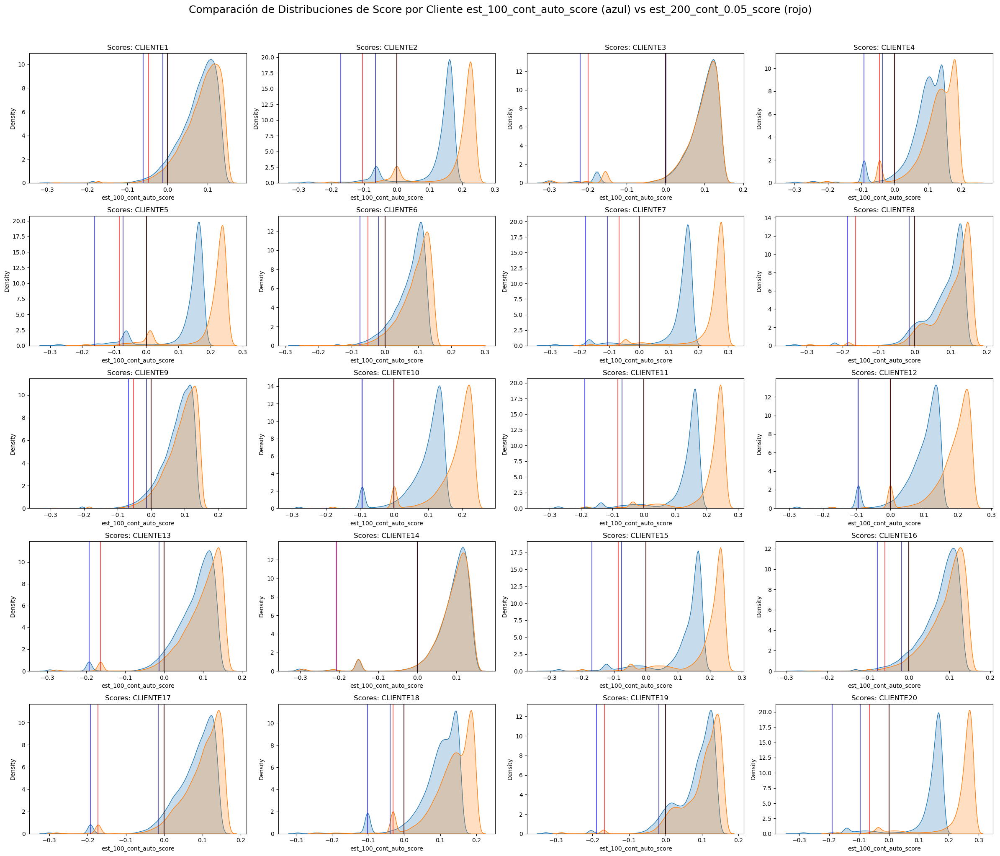

In [75]:
resumen_hyper = calculo_resumen_modelos(dict_hyper)
compare_score("est_100_cont_auto_score","est_200_cont_0.05_score",resumen_hyper)

#### Conclusion

Despues de realizar el analisis de hyperparametros se encuentra que hay una mejora para el modelo en las metricas planteadas, sin embargo se ve en las distribuciones del score para cada cliente un desplazamieto hacia la izquierda de toda la distribucion. Lo que hace que en algunas ocaciones un pico de concentracion de clientes se encuentre en el valor limite 0, lo que hace que el modelo pueda incurrir en errores de clasificacion, sin embargo dado que es el mas robusto de los modelos se decide conservar como el modelo elegido

In [82]:
dict_hyper["est_100_cont_0.05"][0].groupby("cliente")["nivel_anomalia_iforest"].value_counts()

cliente    nivel_anomalia_iforest
CLIENTE1   normal                    41336
           media                      1740
           alta                        436
CLIENTE10  normal                    41336
           media                      1739
           alta                        437
CLIENTE11  normal                    41337
           media                      1740
           alta                        436
CLIENTE12  normal                    41336
           alta                       1940
           media                       236
CLIENTE13  normal                    41336
           media                      1740
           alta                        436
CLIENTE14  normal                    41336
           media                      1740
           alta                        436
CLIENTE15  normal                    41336
           media                      1738
           alta                        438
CLIENTE16  normal                    41337
           media    

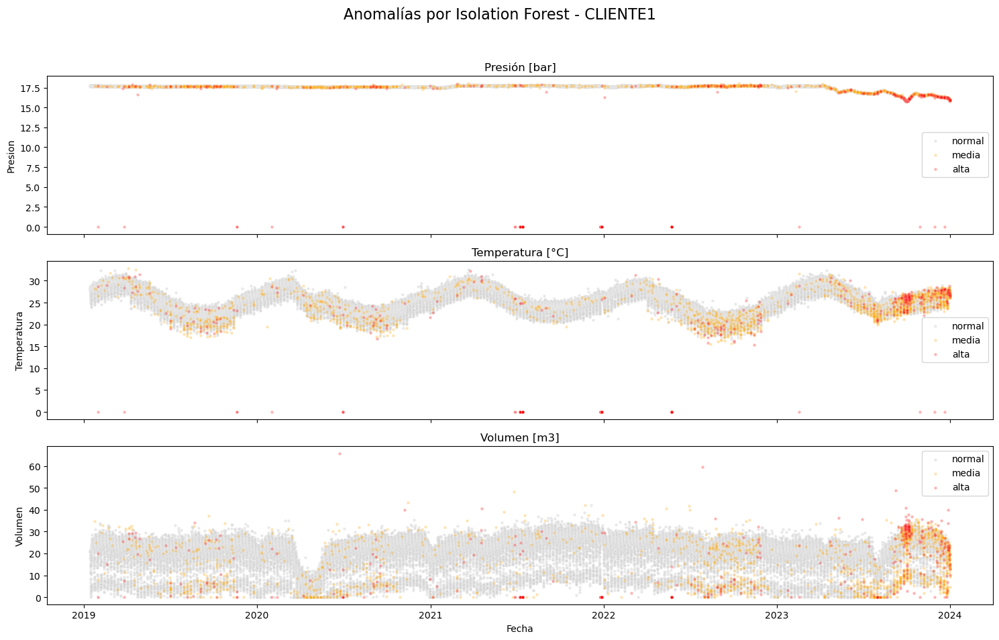

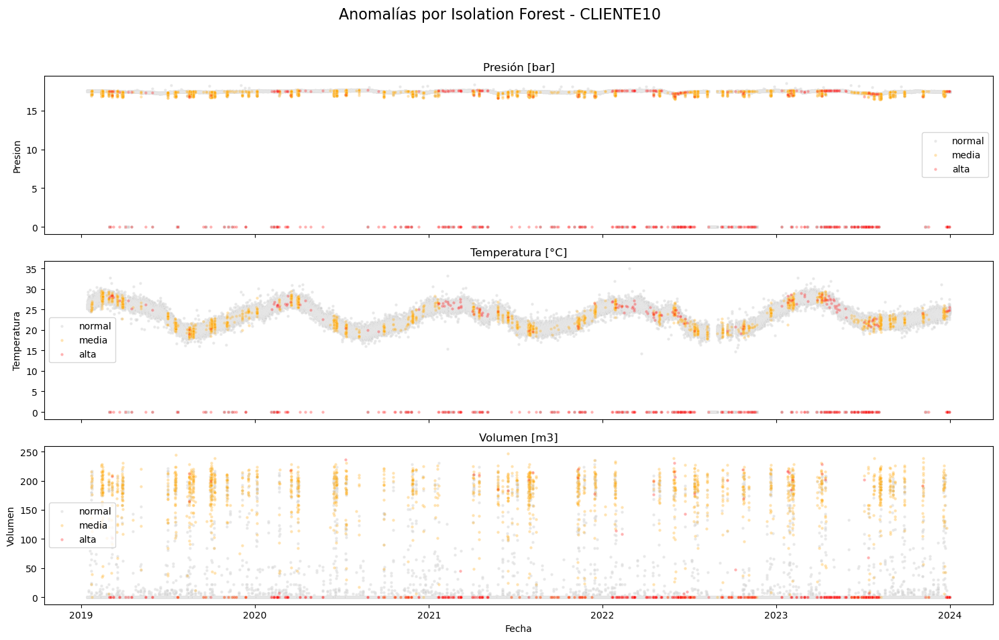

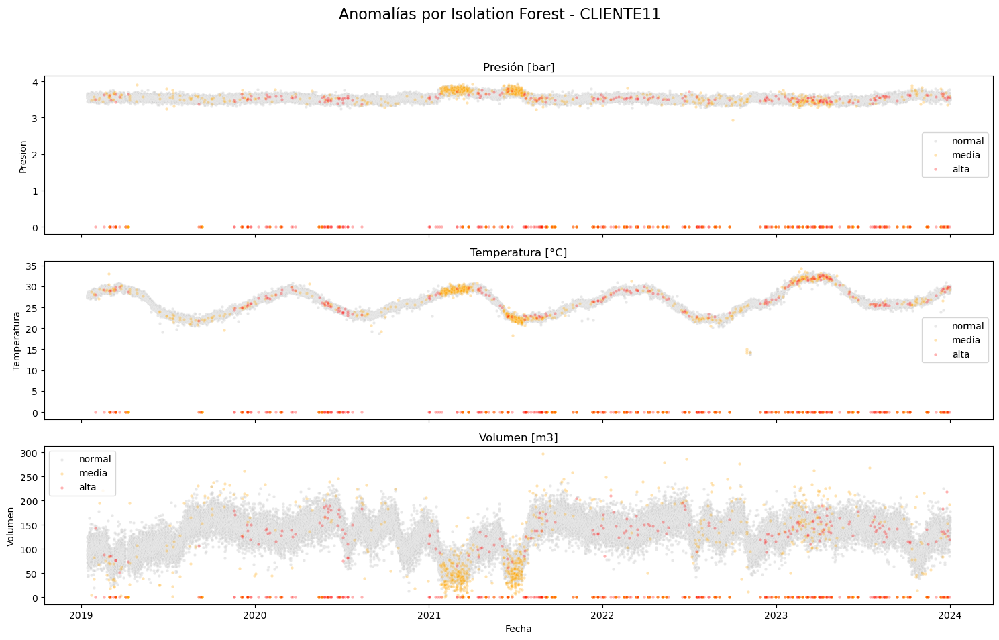

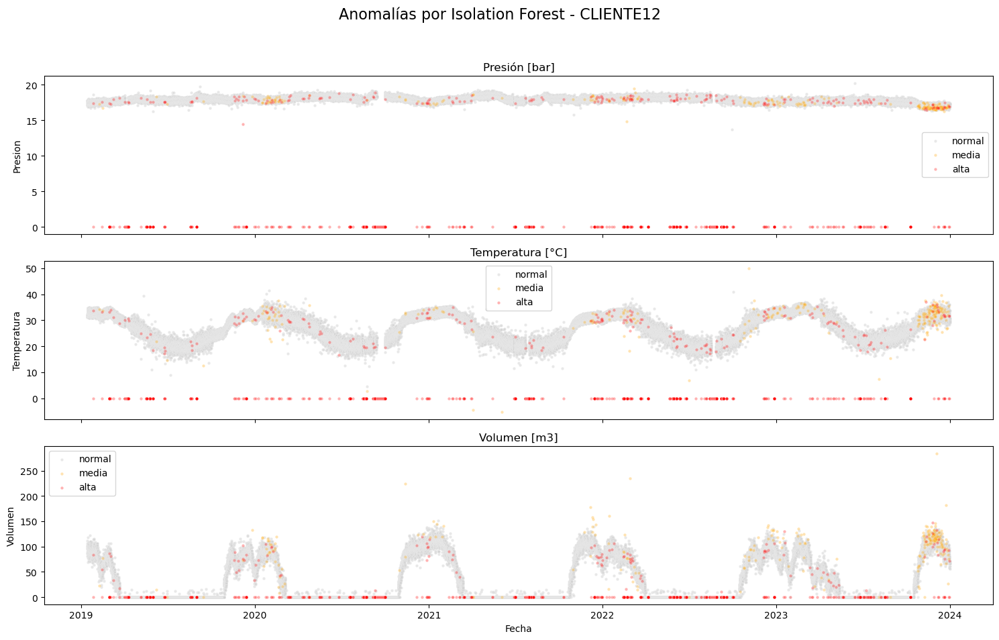

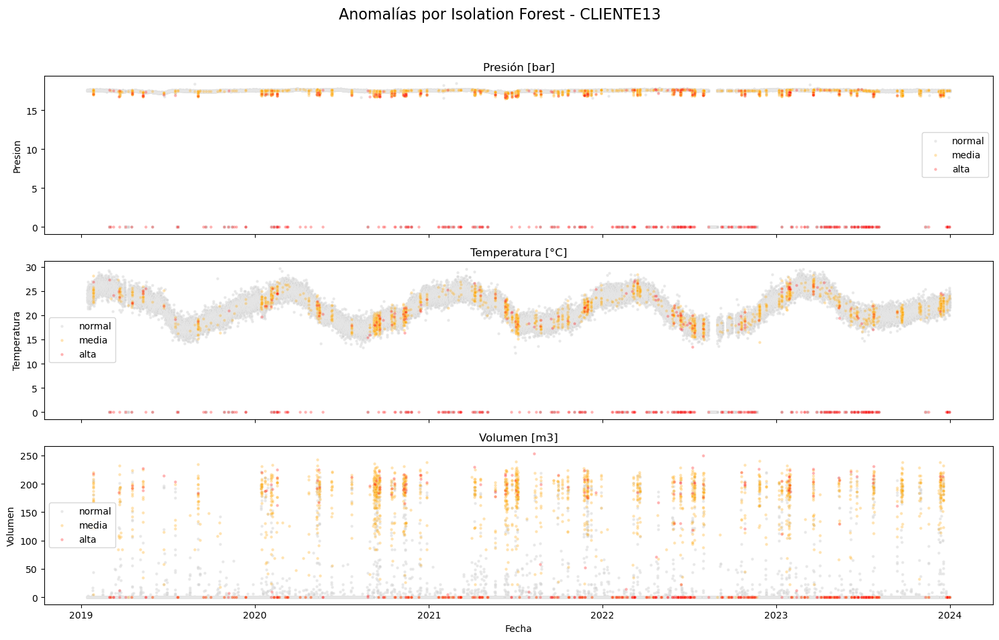

...

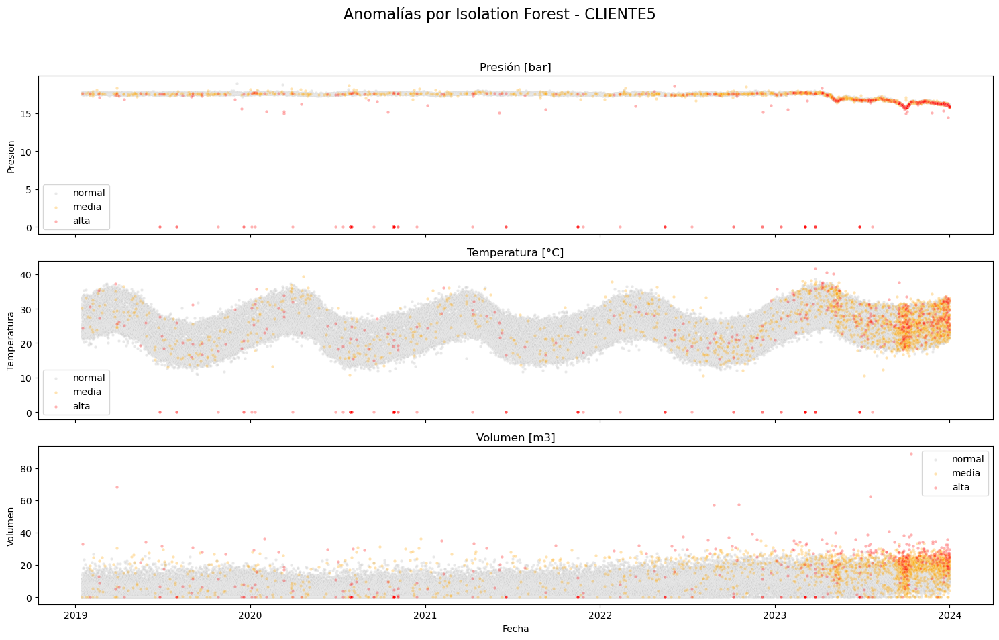

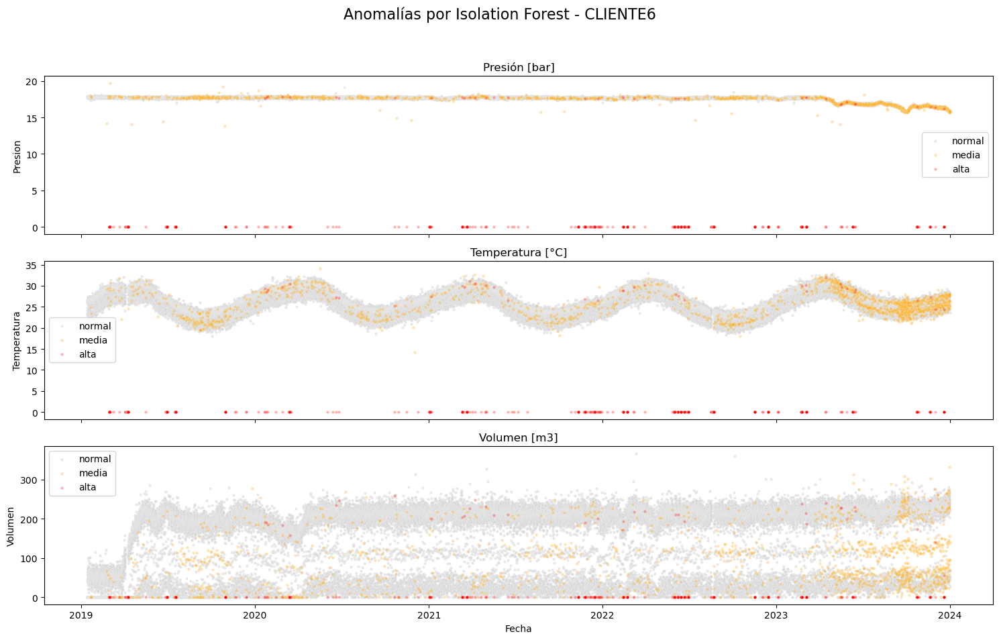

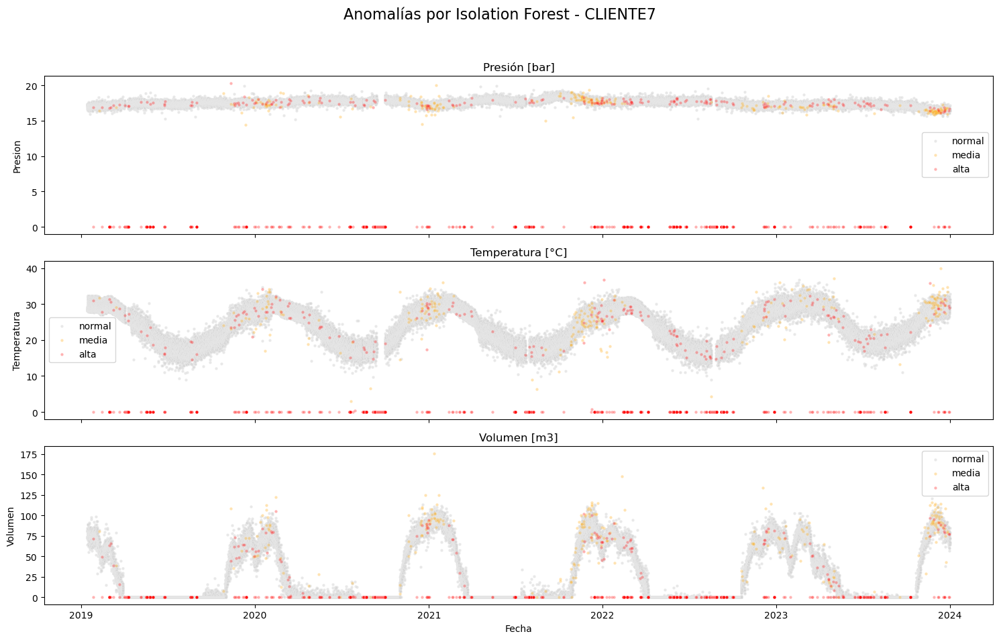

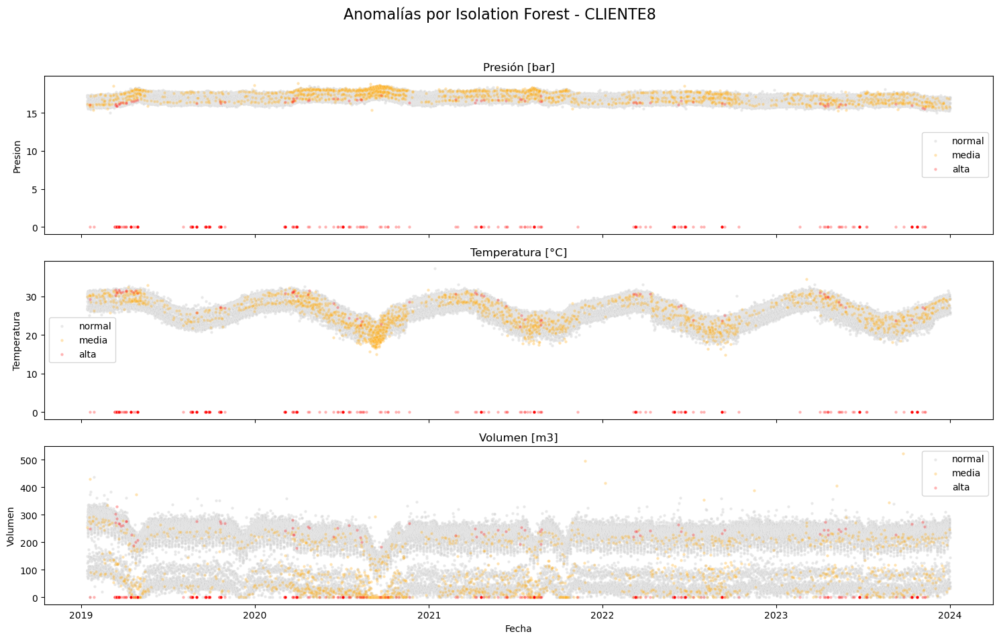

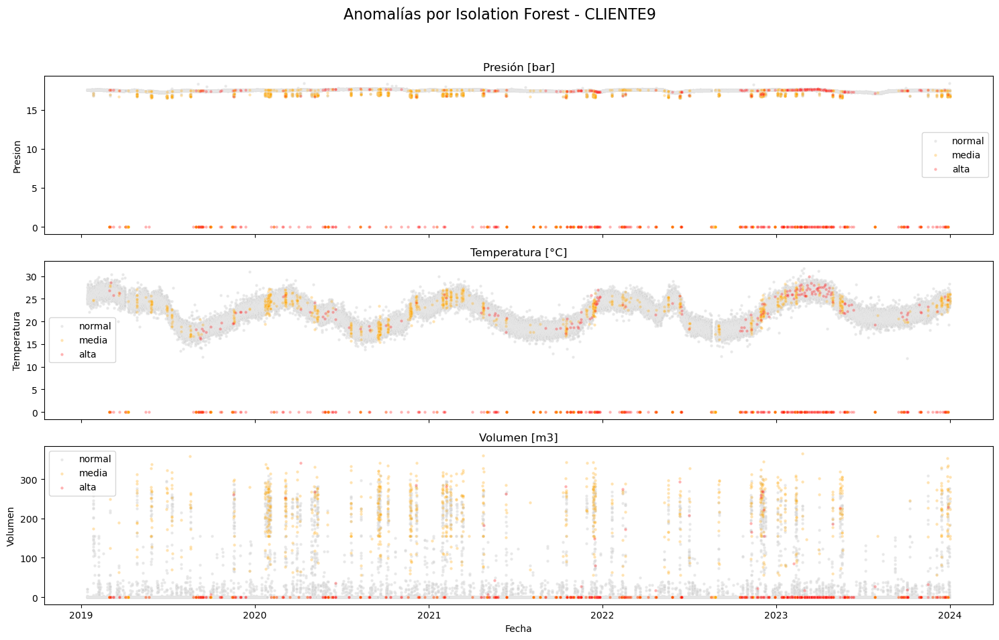

In [84]:
graficar_anomalias_total_clientes(dict_hyper["est_100_cont_0.05"][0])

In [14]:
import joblib
joblib.load('C:/Users/Paul/Documents/Paul/Cursos/Uniandes/maestria_MIAD/202501/proyecto_final/backend/models/CLIENTE1_pipeline.pkl')

IsolationForestWithSeverity()